# Green Coverage and Accessibility Analysis in Valencia

This project analyzes the availability and accessibility of green zones in Valencia using spatial data on census tracts and green areas. The focus is on evaluating green space distribution, accessibility, and its relationship with socioeconomic status.

The data used for this project comes from the following sources:
- **Census and demographic data**: Retrieved from the [Instituto Nacional de Estadística](https://www.ine.es).
- **Green zones and census tracts geospatial data**: Accessed via the [Geo Portal del Ayuntamiento de Valencia](https://valencia.opendatasoft.com/pages/home/) through an API.

## Methodology

The project is divided into several stages:

1. **Exploratory Green Coverage Analysis**:  
   - **Per Capita Availability of Green Space**: This metric is used to assess the adequacy of green spaces relative to the population density in each census tract. Areas with high population density are identified, where additional green spaces may be required.

2. **Accessibility Analysis**:
   - **2SFCA Method**: Accessibility is measured using the 2-Step Floating Catchment Area (2SFCA) method, which factors in:
     - **Distances**: Manhattan distances between census tracts and green zones.
     - **Green Zone Areas**: Larger green spaces have higher scores.
     - **Catchment Area**: A 500-meter isochrone is used to define the accessible area.
	 - **Population**: The population of census tracts is considered to determine how many people benefit from green spaces within the catchment area.

3. **Spatial Autocorrelation**:
   - **Hot Spot and Cold Spot Analysis**: Spatial autocorrelation analysis is applied to identify clusters of census tracts with high or low green coverage.

4. **Geographically Weighted Regression (GWR)**:
   - **Relationship with Socioeconomic Status**: GWR is used to examine the potential correlation between green coverage and socioeconomic indicators such as income and education levels to assess disparities in access to green spaces across different neighborhoods.

In [2]:
# Import libraries

# API requests
import requests

# Data manipulation
import pandas as pd  
import geopandas as gpd  
import pickle 
import numpy as np

# Geometries manipulation
from shapely.geometry import shape, Polygon, MultiPolygon, Point, LineString  

# Visualization
import matplotlib.pyplot as plt  
import seaborn as sns  
import contextily as ctx  

# Spatial analysis
from pysal.lib import weights  
from mgwr.gwr import GWR  
from mgwr.sel_bw import Sel_BW  
from esda.moran import Moran  
import esda  
from splot import esda as esdaplot  

# Statistical analysis
from scipy.stats import norm, shapiro  

# System
from IPython.display import display, HTML
import os  

# Preprocessing
The cleaning process involved filtering the census sections by excluding those from the rural districts of 'Els Pobles' due to their low population density, as outlined in the 'Special Plan for Urban Quality Guidelines' by AUMSA. The central city structure comprises 560 census sections organized into 19 districts. The cleaning and preprocessing steps included merging multiple data sources to create a comprehensive dataset of census tracts, integrating population data along with various socioeconomic indicators such as average income, education levels, and demographics. A new variable for population density was calculated by dividing the population by the area of each tract. Furthermore, district names were standardized for consistency, and any missing district codes were filled and converted to string format to facilitate seamless integration with the green zones dataset.

Green Zones GeoDataFrame extracted successfully
Districts GeoDataFrame extracted succesfully
EPSG:25830


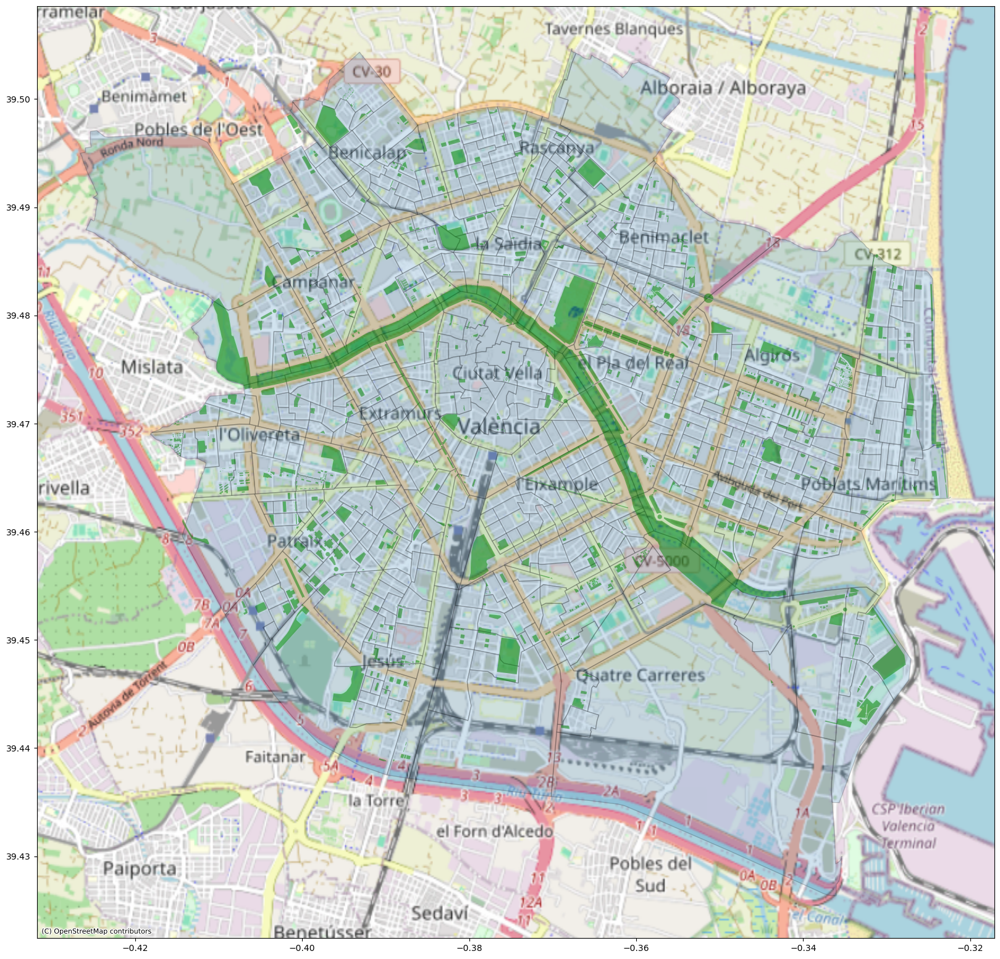

The Green Zones GeoDataFrame contains 434 polygons, each representing a green area categorized into one of three typologies: Parques Urbanos, Jardines Barrio Plaza, Jardines Especial Protección, Unknown

The Census tracts GeoDataFrame contains 560 polygons with 14 features.


,coddistrit,CODSECC,population,st_shape_area,population_density,age_avg,pct_foreigners,education_avg,pct_unemployed,Vm2,income_avg
count,560.000000,560.000000,560.000000,5.600000e+02,560.000000,560.000000,560.000000,560.000000,560.000000,560.000000,560.000000
mean,8.594643,22.246429,1333.998214,8.776598e+04,0.031918,45.170125,0.136744,3.077482,0.166644,418.604899,35691.523214
std,4.433363,13.864666,425.465270,2.819453e+05,0.016584,2.761848,0.064944,0.260910,0.059017,118.348333,11091.875854
min,1.000000,1.000000,603.000000,9.575815e+03,0.000152,33.150000,0.029600,2.550000,0.053400,177.229364,16640.000000
25%,5.000000,11.000000,1008.000000,2.909789e+04,0.019784,43.710000,0.089850,2.880000,0.128700,343.679839,28129.750000
50%,9.000000,21.000000,1266.000000,4.183453e+04,0.031612,45.470000,0.126950,3.040000,0.161000,390.680811,32831.500000
75%,12.000000,32.000000,1587.000000,6.794383e+04,0.041904,46.885000,0.170225,3.290000,0.194850,467.105220,39814.750000
max,16.000000,57.000000,3090.000000,5.264195e+06,0.110607,56.360000,0.544900,3.660000,0.407700,929.741397,88769.000000


In [26]:
%run load_and_process.py

# Green Coverage
Calclulate % of Green Cover in the city:

$$ \% \text{ of Green Cover} = \frac{\text{Green cover in sq km}}{\text{Municipal area in sq km}} \times 100 $$

Per capita availability of green cover is an important indicator to determine whether green cover is sufficient for each
person in the city. Zones in which population density is extremely high, appropriate measures need to be taken to make sure 
that adequate green cover is available per person. Please refer Standards of World Health Organisation, 
which prescribes minimum 9 sqm green cover per person and an ideal of 50 sqm per person.

This analysis calculates the green coverage per person for various zones and districts in a city. We will:
1. Reproject the parks and census data to a common coordinate reference system (CRS).
2. Calculate green coverage in hectares (ha) and square kilometers (sqkm).
3. Calculate the green coverage percentage for the entire city.
4. Aggregate green area per zone and district, and merge it with population data.
5. Visualize green coverage per person by zone and district using bar plots and maps.



Area by category


,tipologia,area_ha
0,Jardines Barrio Plaza,123.56 ha
1,Jardines Especial Protección,37.08 ha
2,Parques Urbanos,223.32 ha




Total Green Coverage: 3.84 sqkm


Total Municipal Area: 49.15 sqkm


Percentage of green cover in the city: 7.82 %


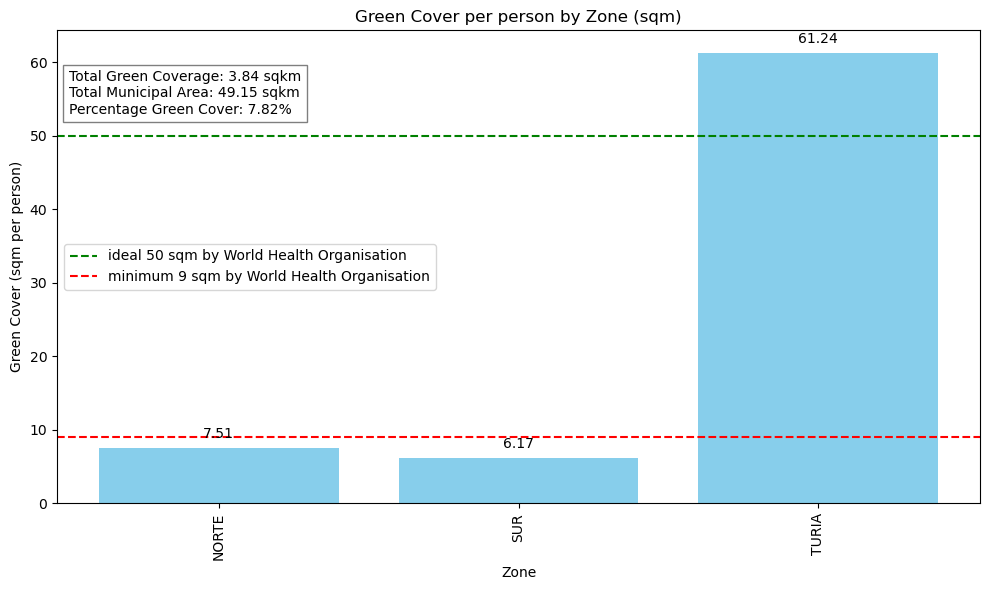

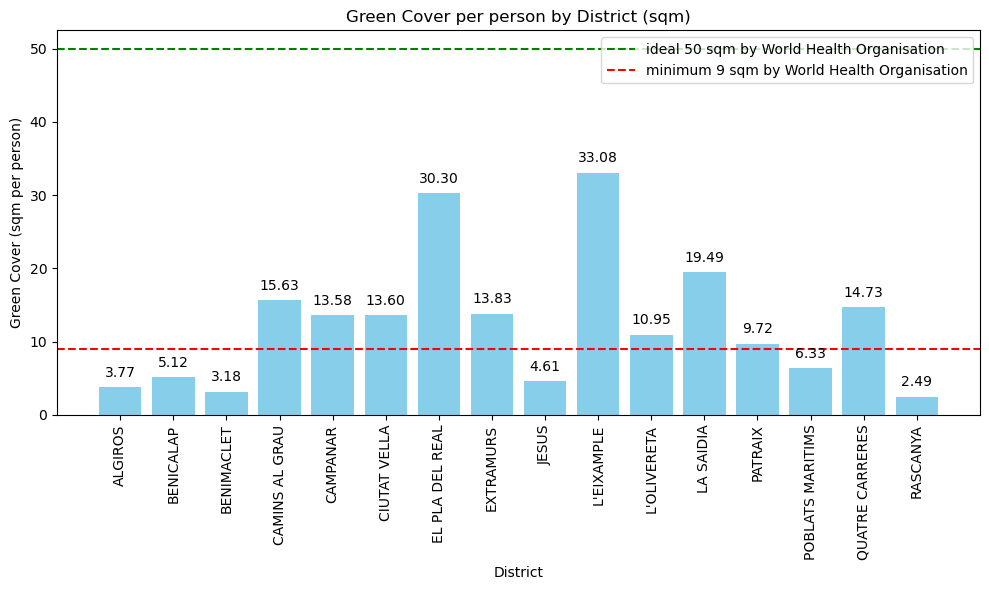

In [66]:
%run coverage.py

# Accessibility Index Calculation Using the 2SFCA Method

The Two-Step Floating Catchment Area (2SFCA) method is a widely used technique to measure accessibility to services or amenities, such as green zones, based on population distribution and proximity to those amenities. This section outlines the calculation of the accessibility index using the 2SFCA method, specifically tailored to the context of evaluating access to green zones in a given area.

## Overview of the 2SFCA Method

The 2SFCA method consists of several steps, which include calculating distances, determining weights based on distance decay, and evaluating the supply-to-demand ratios for each green zone. The accessibility index $ A_j $ for each census tract is calculated based on these components.

### Data Preparation

1. **Reproject Coordinate Reference Systems (CRS)**:
   - The datasets are transformed to a common coordinate reference system (EPSG = 25830), which is crucial for accurate distance calculations.

2. **Calculate Centroids**:
   - For each census tract, the centroid (geometric center) is computed to facilitate distance calculations to green zones.

### Distance Calculations

The next step involves calculating the distances between each census tract centroid and the nearest point in each green zone. This is done using the **Manhattan distance**, defined as:

$$d_{ij} = |x_i - x_j| + |y_i - y_j|$$

Where:
- $ d_{ij} $ is the Manhattan distance between census tract $ i $ and green zone $ j $.
- $ (x_i, y_i) $ are the coordinates of the census tract centroid.
- $ (x_j, y_j) $ are the coordinates of the green zone point.

### Weight Calculations

A distance-decay function is used to assign weights based on proximity. The Gaussian distance-decay function $ G(d_{ij}) $ is defined as:

$$
G(d_{ij}, d_0) = \begin{cases}
\frac{\exp\left(-\frac{1}{2}\left(\frac{d_{ij}}{d_0}\right)^2\right) - \exp\left(-\frac{1}{2}\right)}{1 - \exp\left(-\frac{1}{2}\right)} & \text{if } d_{ij} \leq d_0 \\
0 & \text{if } d_{ij} > d_0
\end{cases}
$$

Where:
- $ d_0 $ is a threshold distance (e.g., 500 meters) beyond which the weight is zero.

### Step 1: Supply-to-Demand Ratio Calculation

The supply-to-demand ratio $ R_i $ for each green zone is computed using the formula:

$$
R_i = \frac{S_i}{\sum_{j \in J_i} P_j \cdot w_{ij}}
$$

Where:
- $ S_i $ is the area of the green zone $ i $.
- $ P_j $ is the population of census tract $ j $.
- $ w_{ij} $ is the weight assigned to census tract $ j $ based on its distance to green zone $ i $.
- $ J_i $ is the set of all census tracts that influence green zone $ i $.

### Step 2: Accessibility Index Calculation

The final step is to calculate the accessibility index $ A_j $ for each census tract using the formula:

$$
A_j = \sum_{i \in I_j} R_i \cdot w_{ij}
$$

Where:
- $ R_i $ is the supply-to-demand ratio for green zone $ i $.
- $ w_{ij} $ is the weight for census tract $ j $ based on the distance to green zone $ i $.
- $ I_j $ is the set of all green zones that influence census tract $ j $.

### Normalization

The calculated accessibility index values are normalized to a range between 0 and 1 using Min-Max scaling:

$$
\text{Normalized } A_j = \frac{A_j - A_{\text{min}}}{A_{\text{max}} - A_{\text{min}}}
$$

Where:
- $ A_{\text{min}} $ and $ A_{\text{max}} $ are the minimum and maximum accessibility values across all census tracts.

Finally, the accessibility index is visualized on a map, highlighting the variation in accessibility to green zones across different census tracts.

The 2SFCA method effectively quantifies accessibility by integrating distance calculations, population distributions, and service availability. This method provides valuable insights for urban planners and policymakers seeking to improve access to green spaces and other amenities.

Loading precomputed distances...


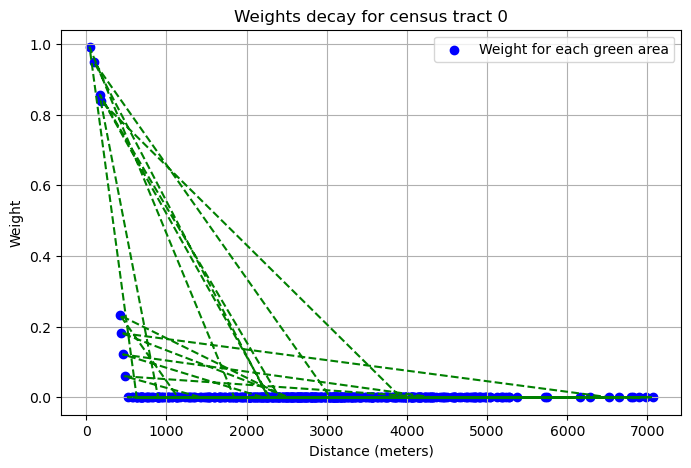

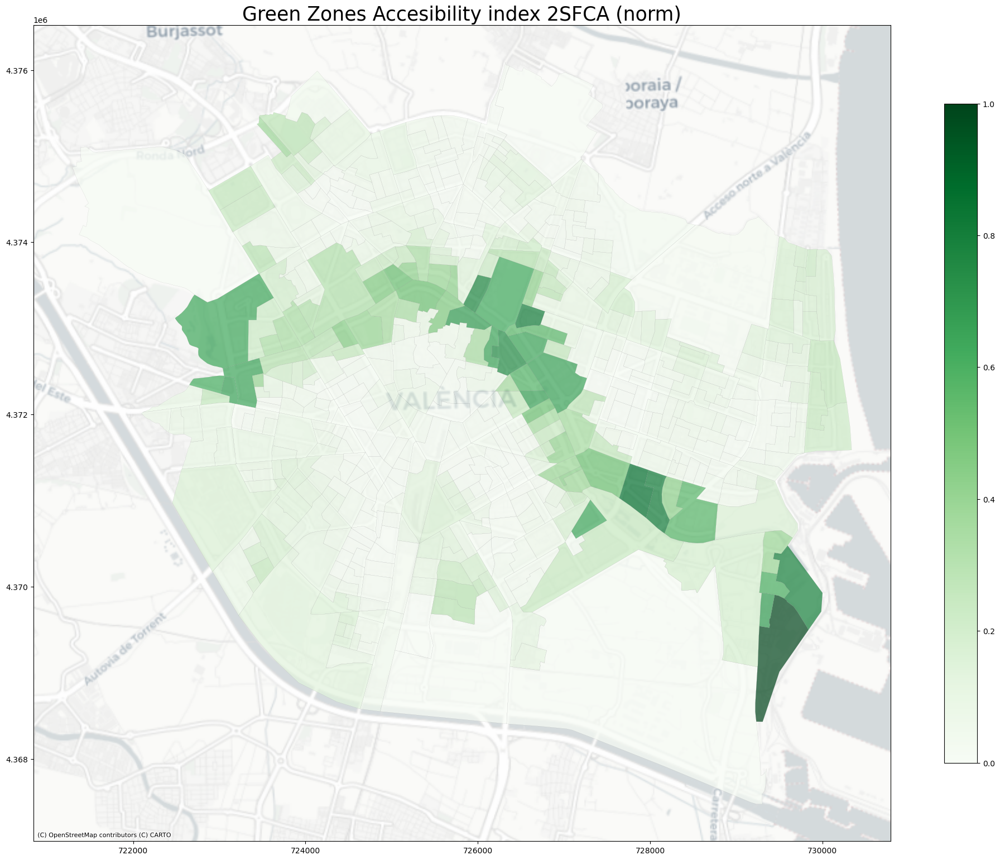

In [51]:
%run f2sfca.py

# Spatial Data Analysis

This section employs various spatial data techniques to explore the accessibility of green areas. The analysis utilizes Geographic Information Systems (GIS) and spatial statistical methods to quantify and visualize the relationships between accessibility to green zones and the socio-spatial characteristics of census tracts.

## 1. **Construction of Spatial Weights**
The analysis constructs a weight matrix using a kernel function, which establishes spatial relationships between census tracts based on proximity. The kernel weights are adaptive, allowing for varying neighbor distances depending on local density. This method ensures that each census tract has a fixed number of neighbors, providing a more nuanced understanding of spatial relationships.

## 2. **Global Spatial Correlation Analysis**
### 2.1 **Spatial Lag Model**
A spatial lag model is employed to examine how accessibility values in one census tract are influenced by neighboring tracts. This helps reveal patterns of spatial dependence, indicating how accessibility to green spaces in one area is affected by adjacent areas.

Choropleth maps are generated to visualize the accessibility of green areas and the corresponding spatial lag. The Fisher-Jenks classification method with k=7 is used to categorize accessibility levels, effectively balancing the complexity of the map and the representation of significant data variations. These maps illustrate the distribution of accessibility across the region.

### 2.2 **Moran's I**
Moran's I statistic is calculated to assess the degree of spatial autocorrelation in the accessibility values. This provides insight into whether nearby census tracts exhibit similar accessibility levels. The resulting Moran plot visually demonstrates the relationship between standardized values and their spatial lag, helping to identify clusters of high or low accessibility.

## 3. **Local Spatial Correlation Analysis**
The analysis extends to local spatial autocorrelation using Local Indicators of Spatial Association (LISA). This method identifies spatial clusters and provides insight into areas where accessibility is significantly different from neighboring regions. A LISA cluster map is generated to visualize these relationships, and a summary of cluster counts is provided to understand the distribution of accessibility levels across census tracts.

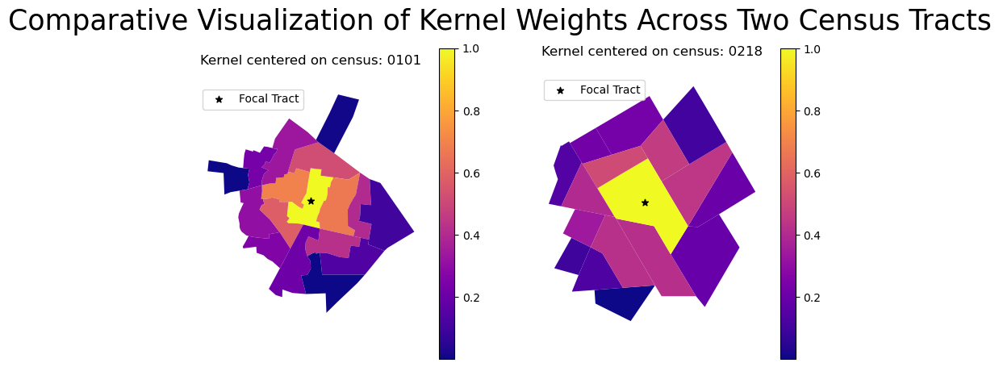

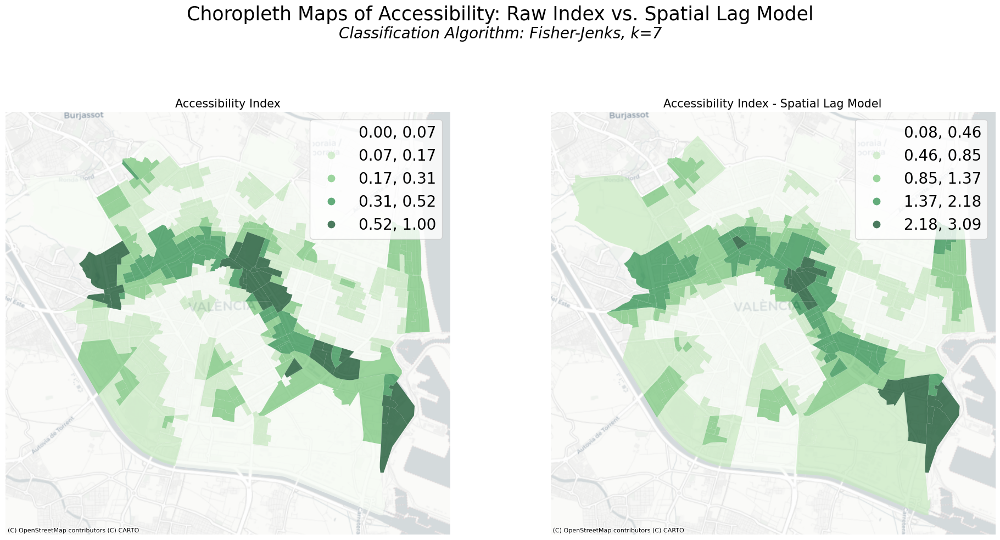

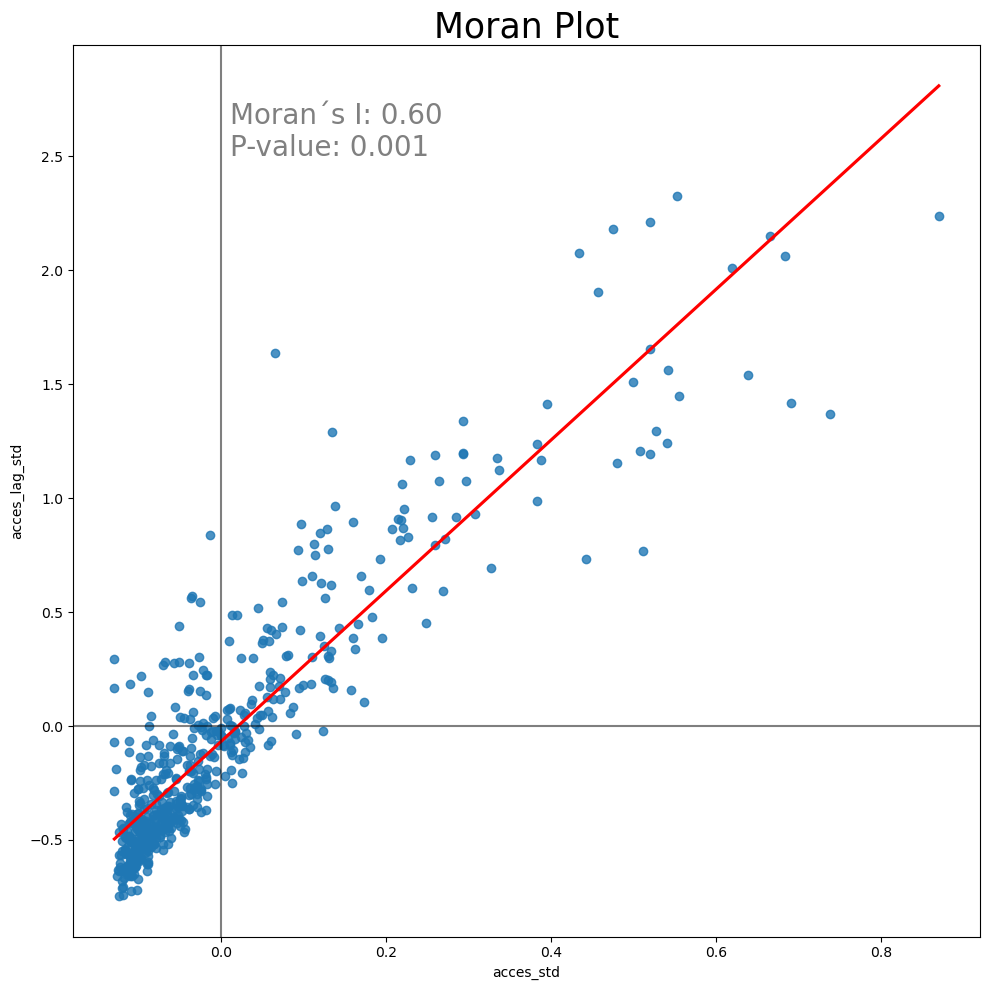

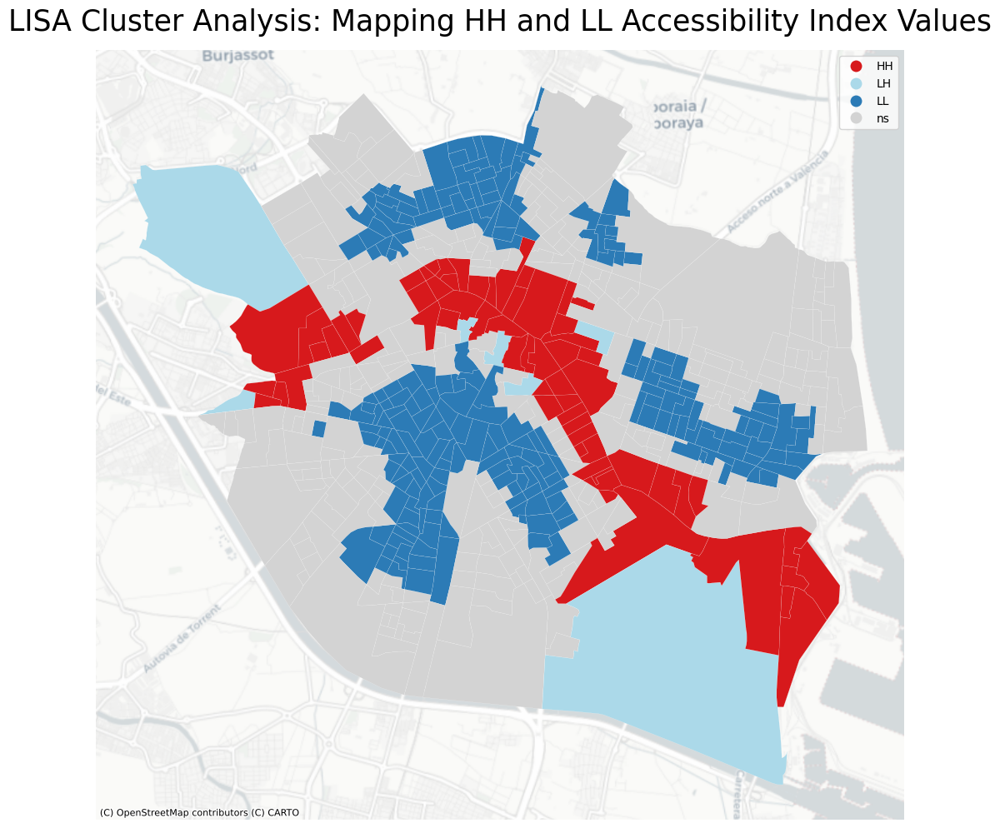

Number of observations in each cluster: 



3    354
1    140
2     36
4     30
Name: count, dtype: int64

In [109]:
%run spatial_analysis.py

# Geographically Weighted Regression


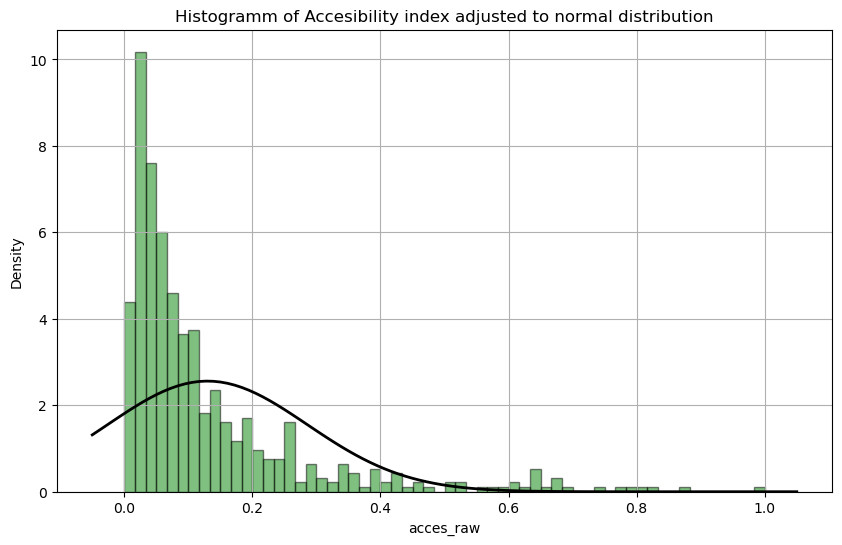

Model type                                                         Gaussian
Number of observations:                                                 560
Number of covariates:                                                     5

Global Regression Results
---------------------------------------------------------------------------
Residual sum of squares:                                             11.384
Log-likelihood:                                                     296.202
AIC:                                                               -582.404
AICc:                                                              -580.252
BIC:                                                              -3500.621
R2:                                                                   0.163
Adj. R2:                                                              0.157

Variable                              Est.         SE  t(Est/SE)    p-value
------------------------------- ---------- ---------- ------

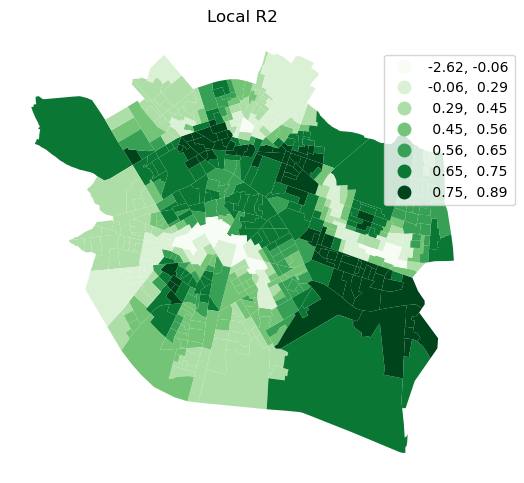

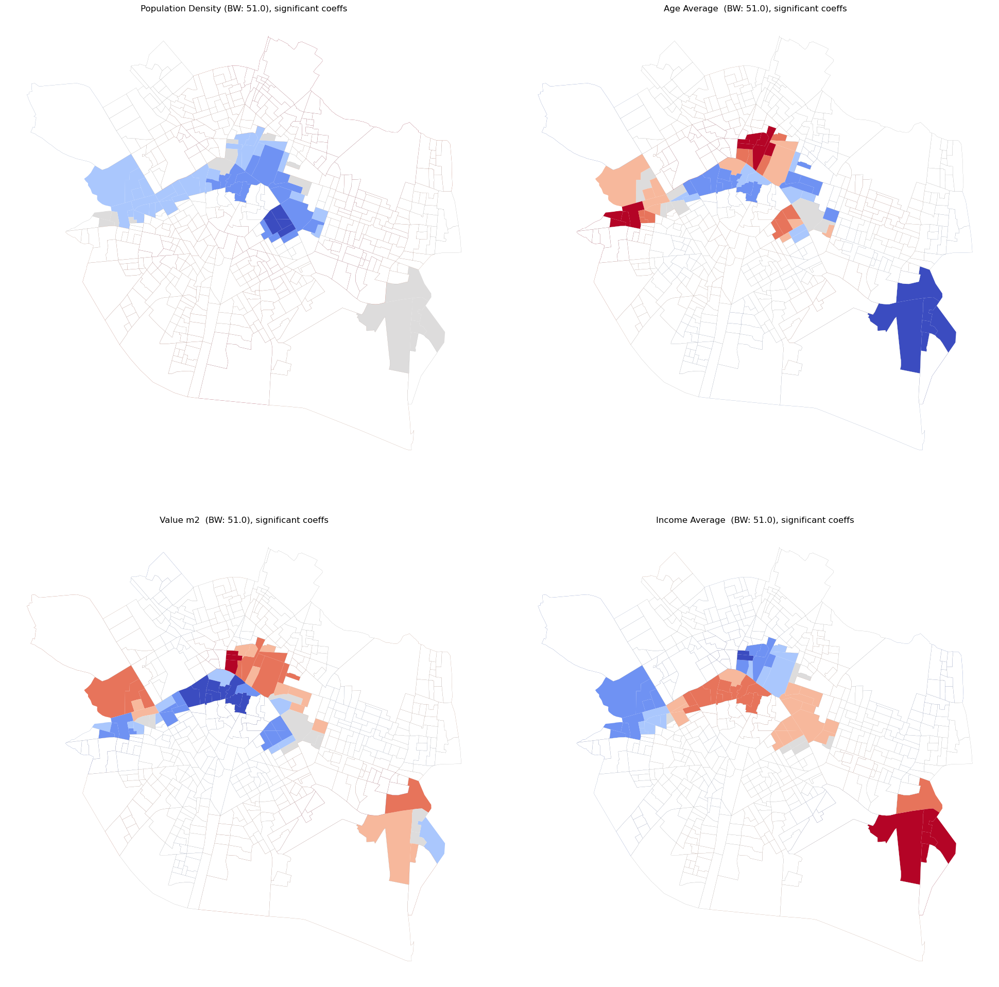

Moran´s I: 0.08162650283113927
p-value: 0.006


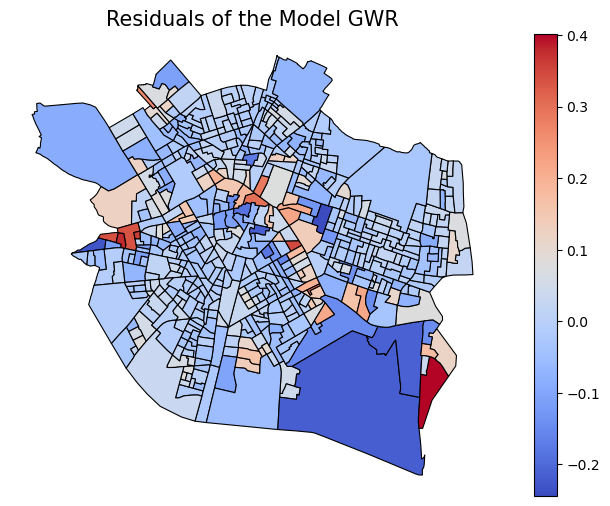

Shapiro-Wilk: 0.8695479523702158
p-value: 3.195893768990443e-21


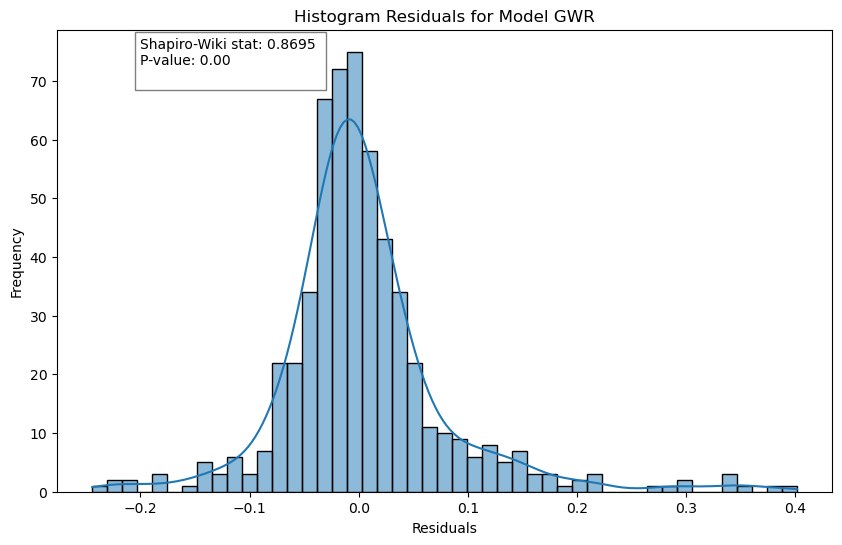

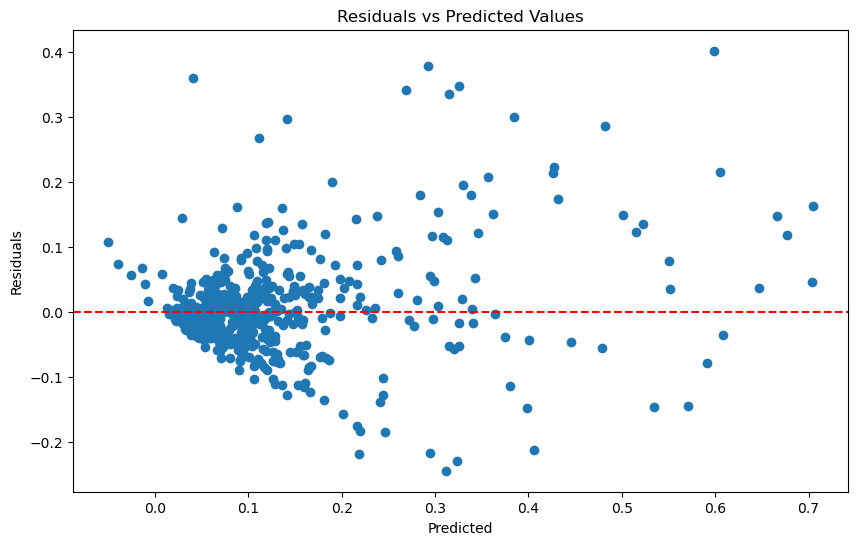

In [113]:
%run gwr.py